In [53]:
import itertools
import os

import caffe
from google.protobuf import text_format
import heapq
import matplotlib.pyplot as plt
import numpy as np
import PIL.Image
from pylab import rcParams

from IPython.display import clear_output

%matplotlib inline
rcParams.update({'figure.figsize': (10, 200)})

In [3]:
caffe_root = '/Development/caffe/' # substitute your path here
model_path = caffe_root+'models/bvlc_googlenet/'
net_fn   = model_path + 'deploy.prototxt'
param_fn = model_path + 'bvlc_googlenet.caffemodel'
model = caffe.io.caffe_pb2.NetParameter()
text_format.Merge(open(net_fn).read(), model)
model.force_backward = True
open('tmp.prototxt', 'w').write(str(model))

net = caffe.Classifier('tmp.prototxt', param_fn,
                       mean = np.float32([104.0, 116.0, 122.0]),
                       channel_swap = (2,1,0))

In [4]:
def encodeImg(img_file, net, d=250, end = 'pool5/7x7_s1'):
  src = net.blobs['data']
  img = PIL.Image.open(img_file)
  img = np.float32(img.resize((d, d), PIL.Image.ANTIALIAS))
  src.reshape(1,3,d,d)
  src.data[0] = img

  net.forward(end=end)
  last_hidden_layer = net.blobs[end].data[0,:,0,0]

  n = len(last_hidden_layer)
  w = int(0.02*n)
  theta = heapq.nlargest(w, last_hidden_layer)[-1]

  return set(np.where(np.asarray(last_hidden_layer) >= theta)[0])

In [5]:
files = []

for root, directories, filenames in os.walk("UCSDped1/Visualize"):
    for filename in filenames:
        if ".tif" in filename:
            img_path = os.path.join(root, filename)
            files.append(img_path)

In [6]:
n = len(files)
encodings = []

for i in range(n):
    print "Encoding:", i, "/", n
    encoding = encodeImg(files[i], net)
    encodings.append(encoding)

Encoding: 0 / 46
Encoding: 1 / 46
Encoding: 2 / 46
Encoding: 3 / 46
Encoding: 4 / 46
Encoding: 5 / 46
Encoding: 6 / 46
Encoding: 7 / 46
Encoding: 8 / 46
Encoding: 9 / 46
Encoding: 10 / 46
Encoding: 11 / 46
Encoding: 12 / 46
Encoding: 13 / 46
Encoding: 14 / 46
Encoding: 15 / 46
Encoding: 16 / 46
Encoding: 17 / 46
Encoding: 18 / 46
Encoding: 19 / 46
Encoding: 20 / 46
Encoding: 21 / 46
Encoding: 22 / 46
Encoding: 23 / 46
Encoding: 24 / 46
Encoding: 25 / 46
Encoding: 26 / 46
Encoding: 27 / 46
Encoding: 28 / 46
Encoding: 29 / 46
Encoding: 30 / 46
Encoding: 31 / 46
Encoding: 32 / 46
Encoding: 33 / 46
Encoding: 34 / 46
Encoding: 35 / 46
Encoding: 36 / 46
Encoding: 37 / 46
Encoding: 38 / 46
Encoding: 39 / 46
Encoding: 40 / 46
Encoding: 41 / 46
Encoding: 42 / 46
Encoding: 43 / 46
Encoding: 44 / 46
Encoding: 45 / 46


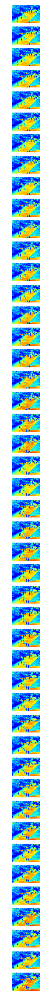

In [69]:
for i in range(n):
    plt.subplot(n, 1, i+1)
    img = plt.imread(files[i])
    plt.axis('off')
    plt.imshow(img)

In [7]:
def overlap(a, b):
    return float(len(a & b)) / max(len(a), len(b))

In [49]:
def showOverlaps(overlaps):
    for i, (o, a, b) in enumerate(overlaps):
        print "Processing:", i+1, "/", len(overlaps)
        
        ax = plt.subplot(len(overlaps)*2, 2, i*2 + 1)
        ax.set_title("Overlap: {0}".format(o))
        img = plt.imread(files[a])
        plt.axis('off')
        plt.imshow(img)

        plt.subplot(len(overlaps)*2, 2, i*2 + 2)
        img = plt.imread(files[b])
        plt.axis('off')
        plt.imshow(img)

In [50]:
overlaps = [(overlap(encodings[a], encodings[b]), a, b) for (a, b) in itertools.combinations(xrange(n), 2)]
overlaps = sorted(overlaps, reverse=True)

Processing: 1 / 25
Processing: 2 / 25
Processing: 3 / 25
Processing: 4 / 25
Processing: 5 / 25
Processing: 6 / 25
Processing: 7 / 25
Processing: 8 / 25
Processing: 9 / 25
Processing: 10 / 25
Processing: 11 / 25
Processing: 12 / 25
Processing: 13 / 25
Processing: 14 / 25
Processing: 15 / 25
Processing: 16 / 25
Processing: 17 / 25
Processing: 18 / 25
Processing: 19 / 25
Processing: 20 / 25
Processing: 21 / 25
Processing: 22 / 25
Processing: 23 / 25
Processing: 24 / 25
Processing: 25 / 25


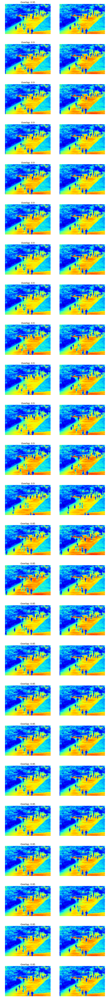

In [54]:
showOverlaps(overlaps[0:25])

Processing: 1 / 25
Processing: 2 / 25
Processing: 3 / 25
Processing: 4 / 25
Processing: 5 / 25
Processing: 6 / 25
Processing: 7 / 25
Processing: 8 / 25
Processing: 9 / 25
Processing: 10 / 25
Processing: 11 / 25
Processing: 12 / 25
Processing: 13 / 25
Processing: 14 / 25
Processing: 15 / 25
Processing: 16 / 25
Processing: 17 / 25
Processing: 18 / 25
Processing: 19 / 25
Processing: 20 / 25
Processing: 21 / 25
Processing: 22 / 25
Processing: 23 / 25
Processing: 24 / 25
Processing: 25 / 25


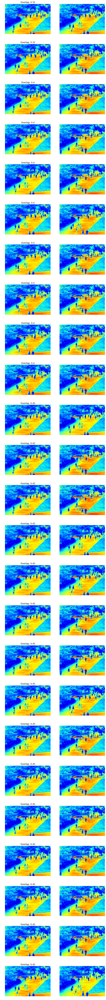

In [55]:
showOverlaps(list(reversed(overlaps))[0:25])